In [2]:
import os 
import numpy as np 
import pandas as pd 
import glob
from PIL import Image
from matplotlib import pyplot as plt
import cv2
import torch
from torch import nn
from torch.nn import functional as nnf
from torchvision.models import resnet18
import time

In [3]:
# !git clone 'https://github.com/frompotenza/SidewalkSegmentation'

Cloning into 'SidewalkSegmentation'...
remote: Enumerating objects: 4921, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 4921 (delta 3), reused 6 (delta 1), pack-reused 4906 (from 3)
Receiving objects: 100% (4921/4921), 1.76 GiB | 46.67 MiB/s, done.
Resolving deltas: 100% (169/169), done.
Updating files: 100% (2828/2828), done.


In [4]:
path_images = '/kaggle/working/SidewalkSegmentation/Dataset'

In [5]:
size = (512, 512)
org_image_list = []
for filename in sorted(glob.glob("/kaggle/working/SidewalkSegmentation/dataset_segmented/*")): 
    if filename.lower().endswith(('.png', '.jpg')): 
        im=Image.open(filename)
        im = im.resize(size)
        im=np.array(im)
        org_image_list.append(im)

In [6]:
size = (512, 512)
seg_image_list = []
for filename in sorted(glob.glob("/kaggle/working/SidewalkSegmentation/segmented_images/*")): 
    if filename.lower().endswith(('.png', '.jpg')): 
        im=Image.open(filename)
        im = im.resize(size)
        im=np.array(im)
        seg_image_list.append(im)

In [7]:
shp_arr_org = [np.shape(org_image_list[i]) for i in range(len(org_image_list))]
print(shp_arr_org[:10])

shp_arr_seg = [np.shape(seg_image_list[i]) for i in range(len(seg_image_list))]
print(shp_arr_seg[:10])

[(512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3)]
[(512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3), (512, 512, 3)]


In [8]:
def extract_green_mask(image_rgb):

    green_mask = (
        (image_rgb[:, :, 0] == 0) &  
        (image_rgb[:, :, 1] == 255) &  
        (image_rgb[:, :, 2] == 0)    
    )
    
    return green_mask.astype(np.uint8)  

In [9]:
seg_image_list = [extract_green_mask(seg_image_list[i]) for i in range(len(seg_image_list))]

In [10]:
print(len(seg_image_list))
print(len(org_image_list))

583
583


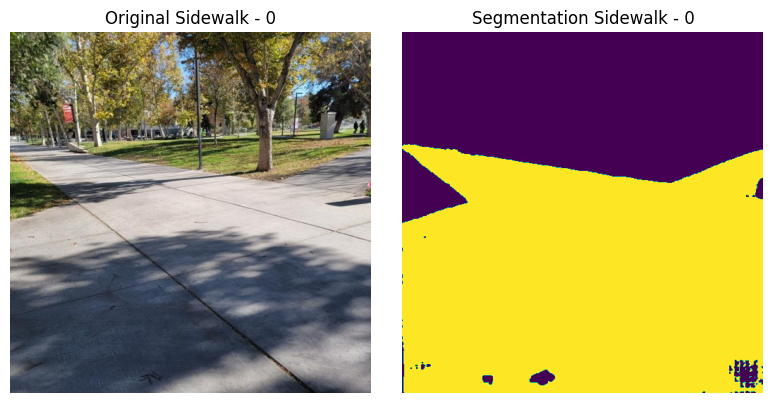

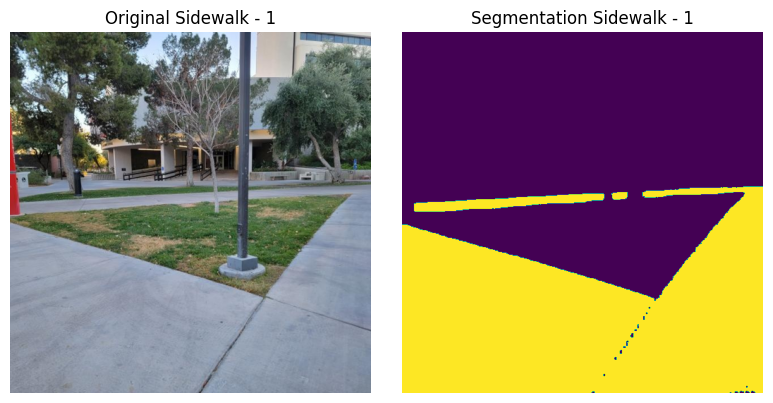

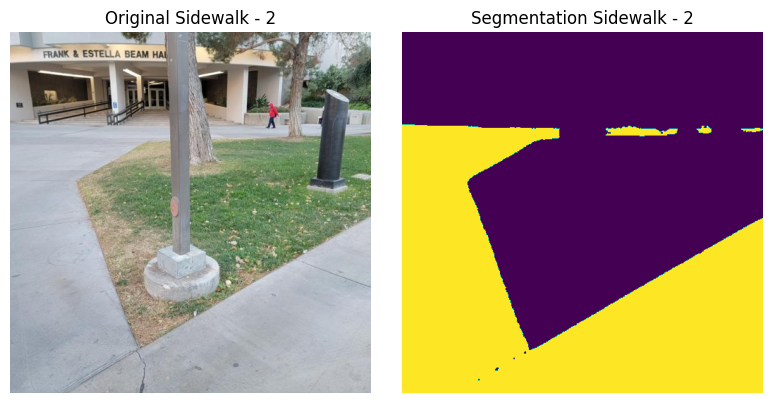

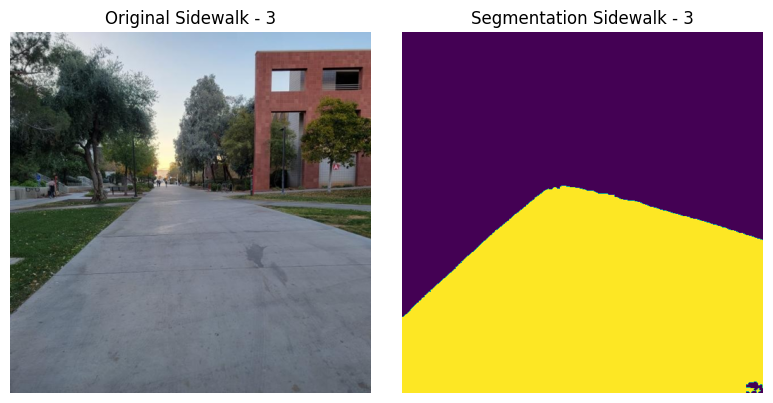

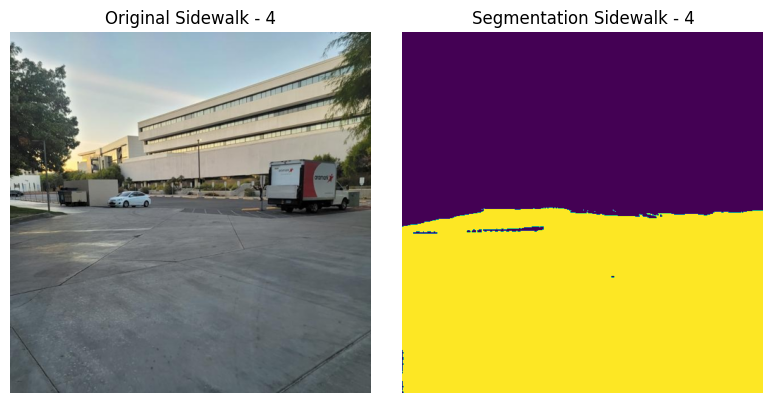

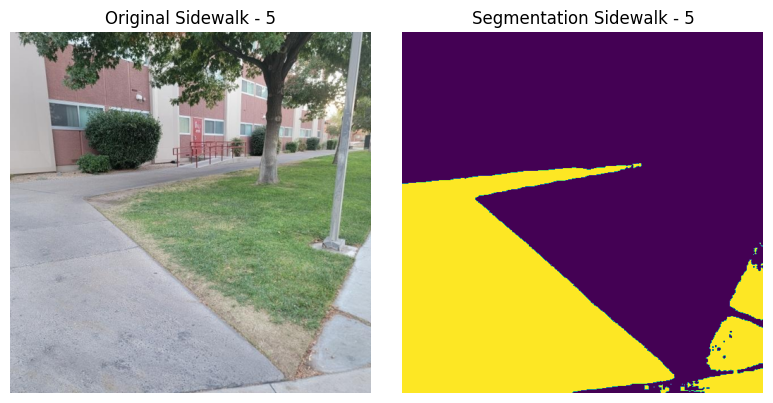

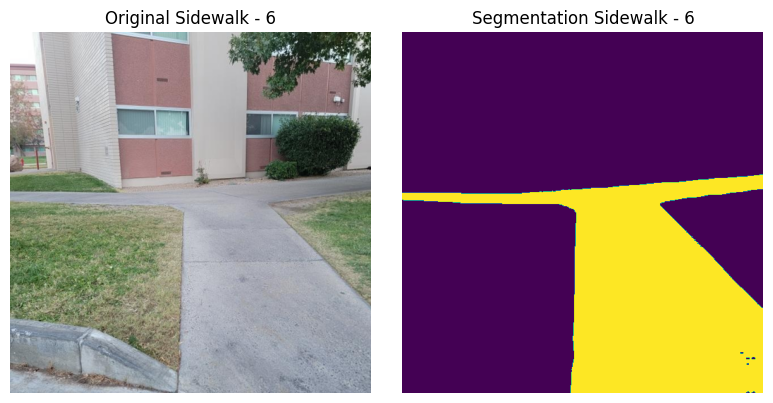

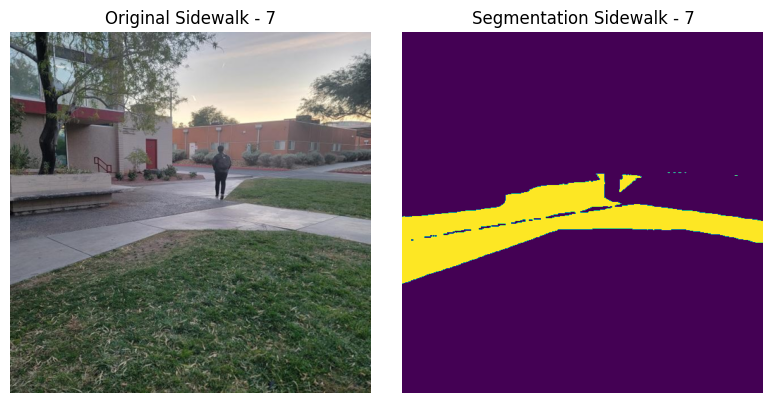

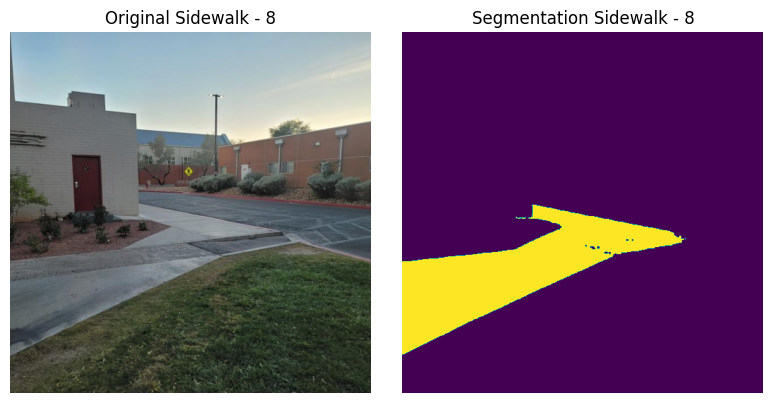

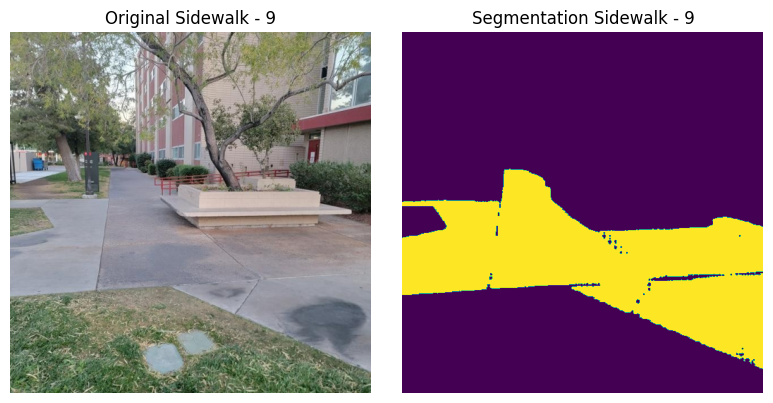

In [11]:
for i in range(10):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    
    ax1.imshow(org_image_list[i])
    ax1.set_title(f'Original Sidewalk - {i}')
    ax1.axis('off')
    
    ax2.imshow(seg_image_list[i])
    ax2.set_title(f'Segmentation Sidewalk - {i}')
    ax2.axis('off')
    
    plt.tight_layout()
    plt.show()

In [23]:

class UBlock(nn.Module):
    def __init__(self, in_channels,posi="Left"):
        ####################
        super().__init__()
        in_channels=int(in_channels)
        if posi=="Left":
            if in_channels == 1 or in_channels == 2 or in_channels == 3:
                out_channels = 64 
            else:
                out_channels = int(2*in_channels)
            self.Block = nn.Sequential(
                nn.Conv2d(in_channels,out_channels,(3,3),device=device,padding="same"),
                nn.ReLU(),
                nn.Conv2d(out_channels,out_channels,(3,3),device=device,padding="same"),
                nn.ReLU()
            )
        else:
            out_channels = int(in_channels//2)
            self.Block = nn.Sequential(
                nn.Conv2d(in_channels,out_channels,(3,3),device=device,padding="same"),
                nn.ReLU(),
                nn.Conv2d(out_channels,out_channels,(3,3),device=device,padding="same"),
                nn.ReLU(),
                nn.ConvTranspose2d(out_channels,out_channels//2,(2,2),device=device,stride=2)
            )
            
            
            
            
    def forward(self, x):
        return self.Block(x)



class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super().__init__()
        self.Pool=nn.MaxPool2d((2,2))
        
        self.Left = nn.Sequential(
            UBlock(in_channels)
        )
        out = 64
        for i in range(3):
            self.Left.append(UBlock(out))
            out*=2
        self.Bottom = nn.Sequential(
            UBlock(out),
            nn.ConvTranspose2d(int(out*2),int(out),(2,2),device=device,stride=2)
        )
            
            
        self.Right = nn.Sequential(
            UBlock(1024,"Right")
        )
        out = 512
        for i in range(2):
            self.Right.append(UBlock(out,"Right"))
            out//=2
            
            
        self.out=nn.Sequential(
            nn.Conv2d(out,out//2,(3,3),device=device,padding="same"),
            nn.ReLU(),
            nn.Conv2d(out//2,out//2,(3,3),device=device,padding="same"),
            nn.ReLU(),
            nn.Conv2d(out//2,out_channels,(1,1),device=device,padding="same")
        )
            
    def forward(self, x):
        left_values=[]
        while x.ndim > 4:
            x = x[0]
        for i in self.Left:
            left_values.append(i(x))
            x=i(x)
            x=self.Pool(x)
        x=self.Bottom(x)
        
        l=len(self.Right)
        for i in range(l):
            x=torch.cat((left_values[l-i],x),-3)
            x=self.Right[i](x)
        x=torch.cat((left_values[0],x),-3)
        return self.out(x)
        


In [24]:
def get_training_data(org_image_list, seg_image_list, nr_samples):

    first = org_image_list[0]
    first = first[None, :]
    print(first.shape)
    
    for i in range(1, nr_samples):
        first = np.concatenate((first, org_image_list[i][None, :]), axis=0)
    
    first_seg = seg_image_list[0]
    first_seg = first_seg[None, :]
    print(first_seg.shape)
    
    for i in range(1, nr_samples):
        first_seg = np.concatenate((first_seg, seg_image_list[i][None, :]), axis=0)

    return first, first_seg 
    
        

In [36]:
images, binary_masks = get_training_data(org_image_list, seg_image_list, 525)

(1, 512, 512, 3)
(1, 512, 512)


In [37]:
device = "cuda"

SemNet = UNet(3,1).to(device)

In [38]:
epo = 200

opt = torch.optim.Adam(SemNet.parameters(), lr=1e-4)
scheduler=torch.optim.lr_scheduler.CosineAnnealingLR(opt,epo)
lossfunc = nn.BCEWithLogitsLoss()
#loss = 
losses = []
print(images.shape)
print(binary_masks.shape)
masks_tensor = torch.tensor(binary_masks).float().cuda()
images_tensor = torch.tensor(images).permute((0,3,1,2)).float()[:,None,:].cuda()
print(images_tensor.shape)
print(masks_tensor.shape)
#sem = np.where(orig>0,1,0)
start=time.time()
for i_epoch in range(epo):
    for i in range(0, 520, 5):
        pred = SemNet(images_tensor[i:i+5])
        opt.zero_grad()
        loss = lossfunc(pred.squeeze(), masks_tensor[i].squeeze())
            
        loss.backward()
        
        opt.step()
        
        losses += [float(loss)]
    scheduler.step()
    if (i_epoch+1)%10==0:  
        print("loss: "+str(np.mean(losses))+" epoch "+str(i_epoch+1))
    losses = []
print("Semantic Net DONE")
print(time.time()-start)


(525, 512, 512, 3)
(525, 512, 512)
torch.Size([525, 1, 3, 512, 512])
torch.Size([525, 512, 512])
loss: 0.4395412744667668 epoch 10
loss: 0.3824872042124088 epoch 20
loss: 0.3523491741372989 epoch 30
loss: 0.314866979391529 epoch 40
loss: 0.2666754991425058 epoch 50
loss: 0.20159170936005047 epoch 60
loss: 0.14897079900122032 epoch 70
loss: 0.0883718425846802 epoch 80
loss: 0.06346296154795429 epoch 90
loss: 0.04396798337648551 epoch 100
loss: 0.027691237663160652 epoch 110
loss: 0.023627322522000983 epoch 120
loss: 0.01734586832418035 epoch 130
loss: 0.013410964426629316 epoch 140
loss: 0.011428747401133968 epoch 150
loss: 0.009664533363180593 epoch 160
loss: 0.008649398981875632 epoch 170
loss: 0.008104575659672264 epoch 180
loss: 0.007880258732676828 epoch 190
loss: 0.0078299747994886 epoch 200
Semantic Net DONE
5897.438014984131


In [45]:
save_path = "/kaggle/working/model_weights.pth"
torch.save(SemNet.state_dict(), save_path)

In [46]:
SemNet.eval()
Sem_pred = SemNet.to(device)

In [47]:
def get_eval_seg(org_image_list):
    
    eval_seg = org_image_list[0]
    eval_seg = eval_seg[None, :]

    for i in range(1, len(org_image_list)-1):
        eval_seg = np.concatenate((eval_seg, org_image_list[i][None, :]), axis=0)
    return eval_seg

In [52]:
eval_seg = get_eval_seg(org_image_list[450:480])

In [53]:
def get_predictions(eval_seg):
    for i in range(len(eval_seg)):
        eval_seg_pred = torch.tensor(eval_seg[i]).permute((2,0,1)).float()[None,:].to(device)
        pred_sem = Sem_pred(eval_seg_pred)
        pred_sem = pred_sem.squeeze().cpu().detach().numpy()>0.5
        out_seg = np.where(pred_sem==True,1, 0)

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
    
        ax1.imshow(eval_seg[i])
        ax1.set_title(f'Eval Sidewalk - {i}')
        ax1.axis('off')
        
        ax2.imshow(out_seg)
        ax2.set_title(f'Pred Sidewalk - {i}')
        ax2.axis('off')
        
        plt.tight_layout()
        plt.show()

        

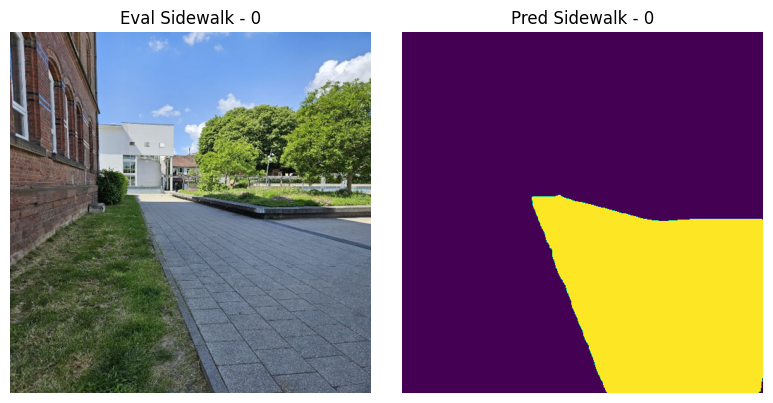

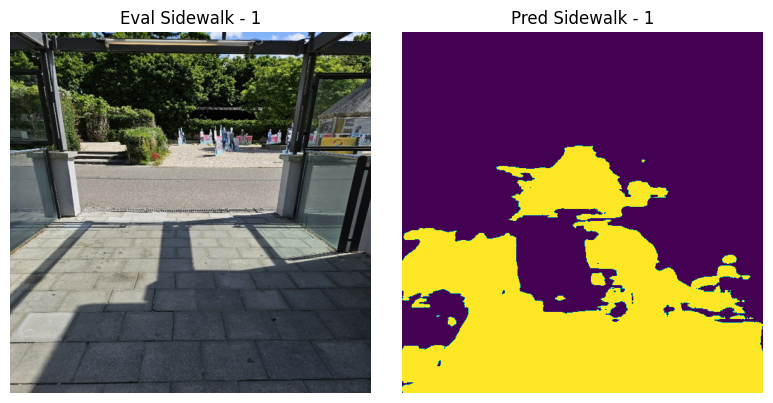

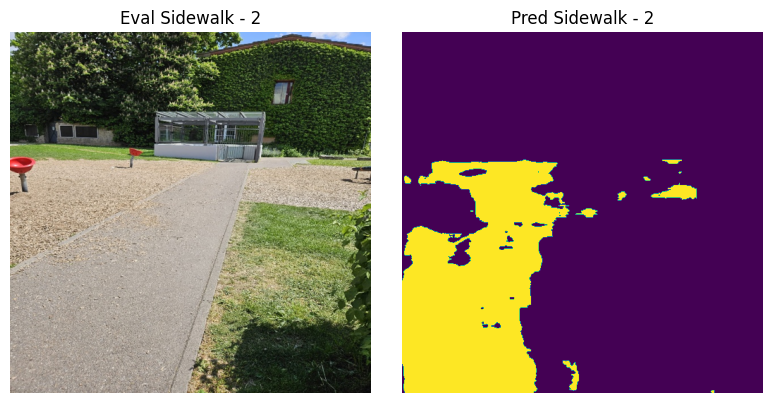

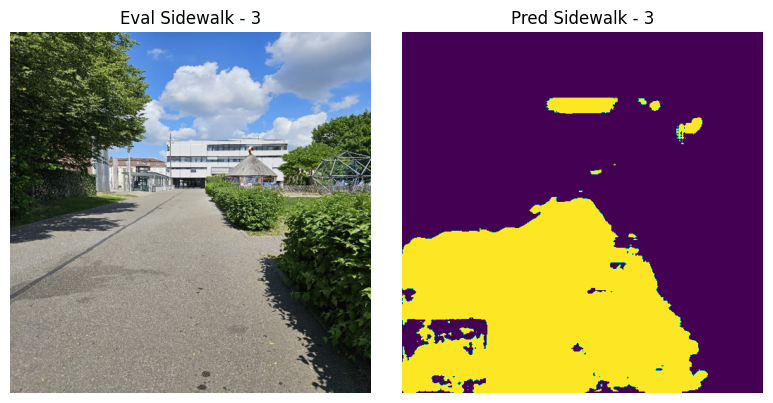

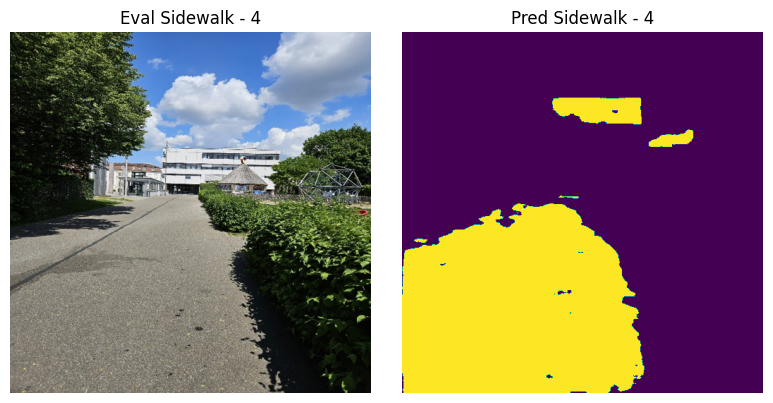

...

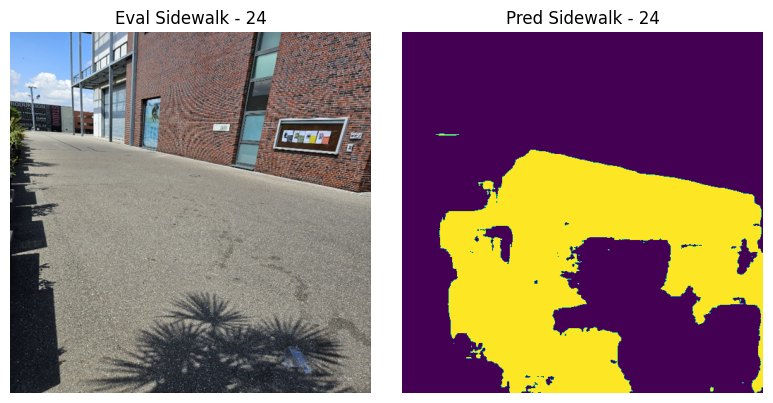

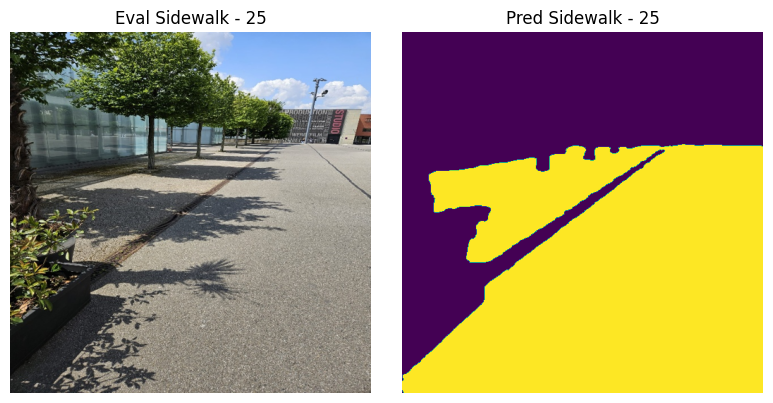

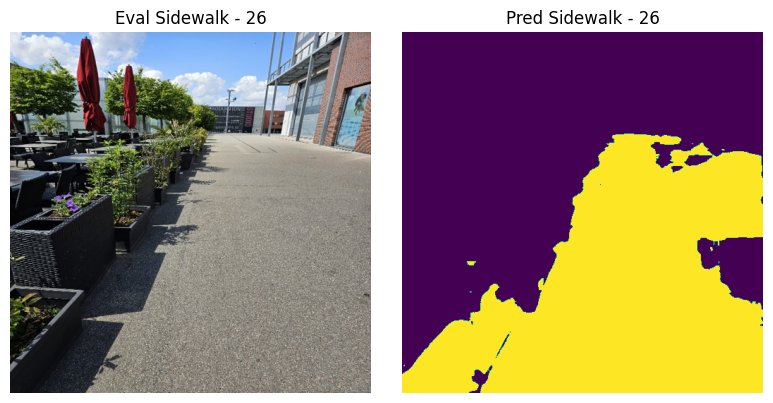

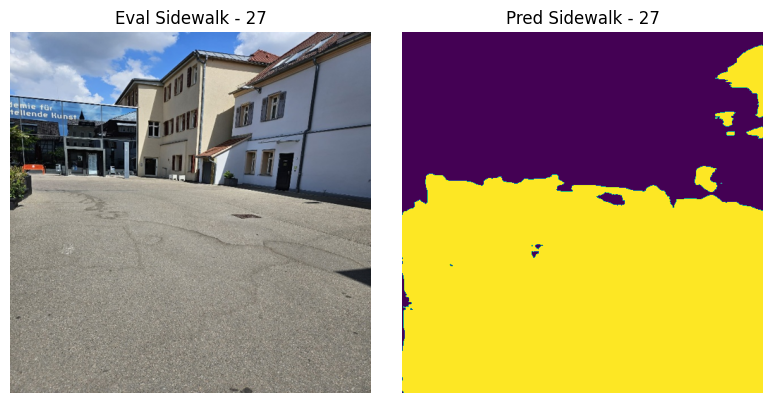

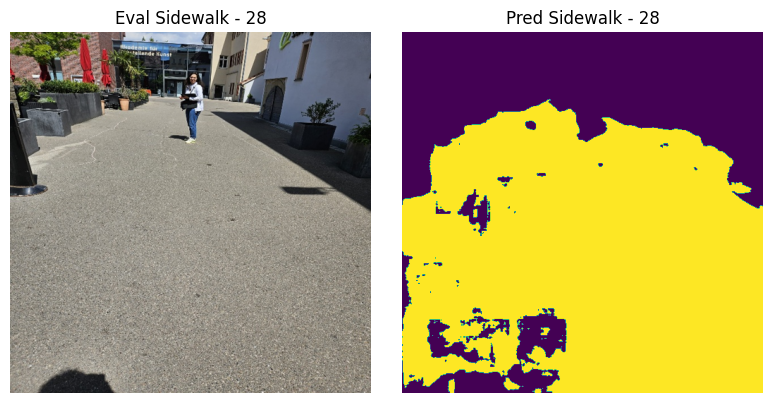

In [54]:
get_predictions(eval_seg)

In [51]:
eval_seg = org_image_list[61]
eval_seg = eval_seg[None, :]

for i in range(62, 71):
    eval_seg = np.concatenate((eval_seg, org_image_list[i][None, :]), axis=0)

In [ ]:
eval_seg_pred = torch.tensor(eval_seg[0]).permute((2,0,1)).float()[None,:].to(device)
pred_sem_pred = Sem_cpu(eval_seg_pred)

In [ ]:
pred_sem = pred_sem_pred.squeeze().cpu().detach().numpy()>0.5
out_seg = np.where(pred_sem==True,1, 0)

In [ ]:
eval_seg_pred = torch.tensor(eval_seg[1]).permute((2,0,1)).float()[None,:].to(device)
pred_sem_pred = Sem_cpu(eval_seg_pred)

In [ ]:
plt.imshow(org_image_list[12])